In [ ]:
# default_exp diffusion_distance_flow_embedder
from nbdev.showdoc import *
import numpy as np
import matplotlib.pyplot as plt
import torch
import directed_graphs
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Diffusion Distance Based Loss

Explorations and visualizations.

In this notebook, we'll subclass the 05c01a FETrainer and tailor it to the Mean Squared Error loss function in MFE.

It will be helpful to compare the two different distance matrices, so here's a visualization function for that:

In [ ]:
# export
def compare_distance_matrices(embedded_points, FE, **kwargs):
    fig, ax = plt.subplots(1,2)
    ax[0].imshow(FE.precomputed_distances.cpu().numpy())
    ax[0].set_title("Diff Distances")
    ax[1].imshow(torch.cdist(embedded_points, embedded_points).detach().cpu().numpy())
    ax[1].set_title("Embedding Euclidean")
    plt.show()

In [ ]:
# export
import torch
import matplotlib.pyplot as plt
from directed_graphs.multiscale_flow_embedder import MultiscaleDiffusionFlowEmbedder
from directed_graphs.flow_embedding_training_utils import FETrainer, visualize_points, save_embedding_visualization
class DiffusionDistanceFlowEmbedder(FETrainer):
    def __init__(self, X, flows, labels, device = torch.device("cuda" if torch.cuda.is_available() else "cpu")):
        super().__init__(X, flows, labels, device = device)
        self.vizfiz = [
            save_embedding_visualization,
            visualize_points,
            compare_distance_matrices,
        ]
        loss_weights = {
            "diffusion":0,
            "smoothness":0,
            "reconstruction":0,
            "diffusion map regularization":1,
            "flow cosine loss": 0,
        }
        self.FE = MultiscaleDiffusionFlowEmbedder(
            X = X,
            flows = flows,
            sigma_graph = 1,
            flow_strength_graph = 1,
            device = device,
            use_embedding_grid = False,
            loss_weights = loss_weights,
            k_dmap = 15,
            t_dmap = 50,
        ).to(device)
        # visualize diffusion map
        plt.scatter(self.FE.diff_coords[:,0].cpu().numpy(),self.FE.diff_coords[:,1].cpu().numpy(),c=labels)
        self.title = "Diffusion Distance FE"
        

In [ ]:
from directed_graphs.datasets import directed_swiss_roll_sklearn, plot_directed_3d
X, flow, labels = directed_swiss_roll_sklearn(num_nodes=2000)

In [ ]:
X = torch.tensor(X).float().to(device)
flow = torch.tensor(flow).float().to(device)
X = X.float().to(device)
flow = flow.float().to(device)

/gpfs/loomis/project/krishnaswamy_smita/kjm76/directed_graphs/directed_graphs/utils.py:12: UserWarning: Sparsifying input to bsr_array
  warnings.warn("Sparsifying input to bsr_array")


using sigma =  2.1068635
[1.0000005 +0.j 0.98382694+0.j 0.9766961 +0.j 0.97409946+0.j
 0.95284826+0.j]


/gpfs/loomis/project/krishnaswamy_smita/kjm76/conda_envs/flowembed/lib/python3.9/site-packages/matplotlib/transforms.py:775: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


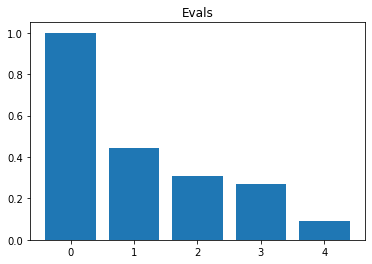

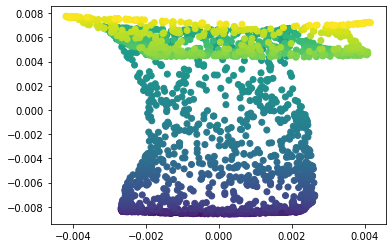

In [ ]:
DODO_FET = DiffusionDistanceFlowEmbedder(X, flow, labels = labels, device = device)

  0%|          | 0/100 [00:00<?, ?it/s]

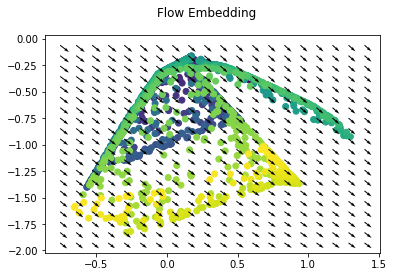

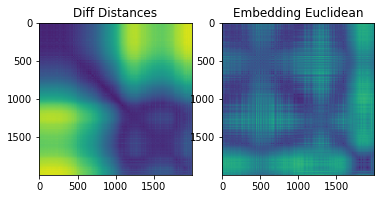

  1%|          | 1/100 [00:01<03:02,  1.84s/it]

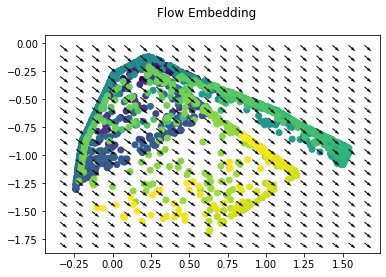

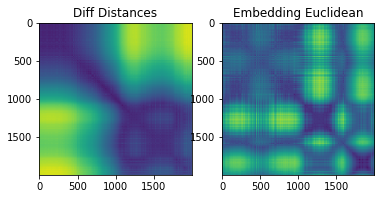

  2%|▏         | 2/100 [00:03<02:53,  1.77s/it]

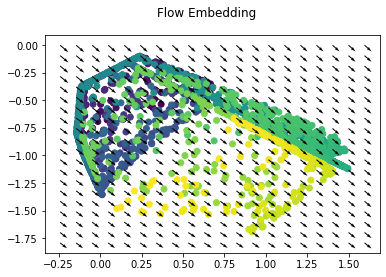

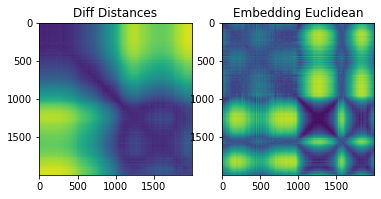

  3%|▎         | 3/100 [00:05<02:49,  1.75s/it]

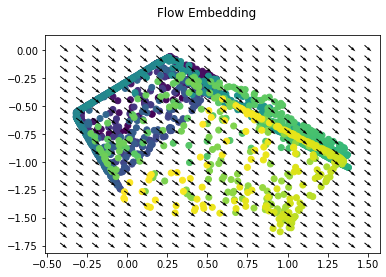

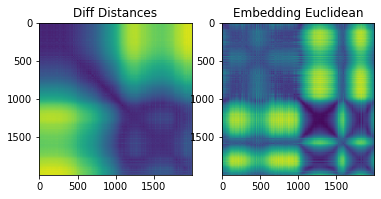

  4%|▍         | 4/100 [00:07<02:49,  1.76s/it]

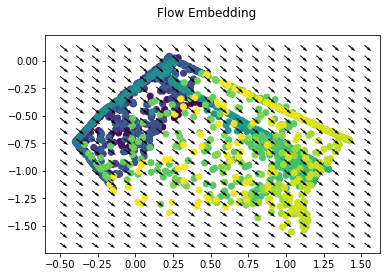

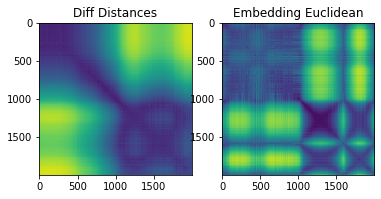

  5%|▌         | 5/100 [00:08<02:45,  1.75s/it]

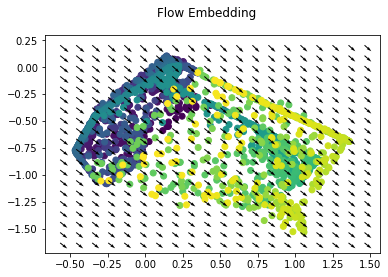

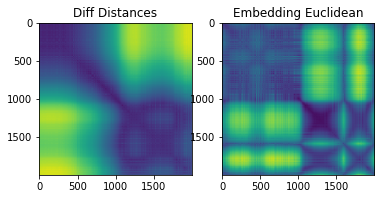

  6%|▌         | 6/100 [00:10<02:43,  1.74s/it]

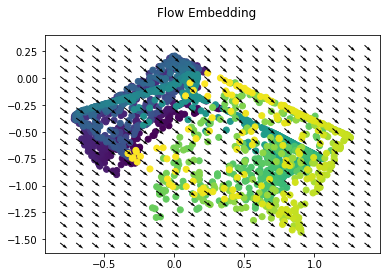

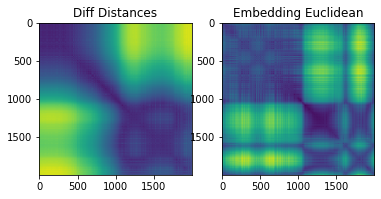

  7%|▋         | 7/100 [00:12<02:47,  1.80s/it]

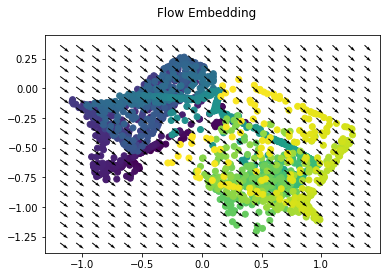

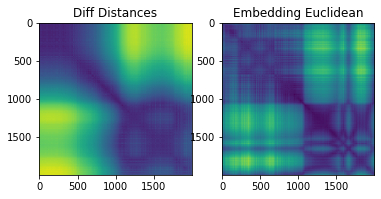

  8%|▊         | 8/100 [00:14<02:42,  1.77s/it]

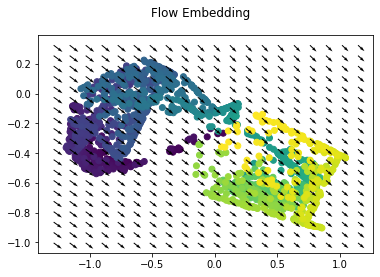

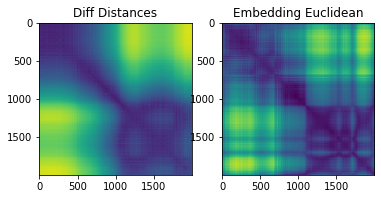

  9%|▉         | 9/100 [00:15<02:38,  1.74s/it]

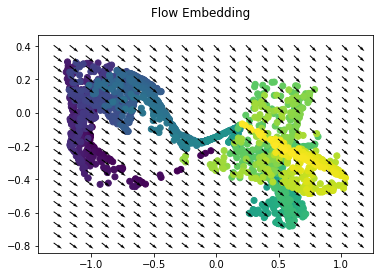

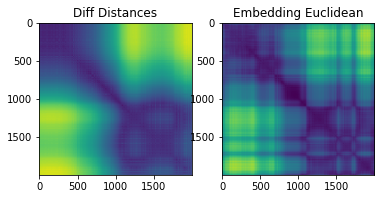

 10%|█         | 10/100 [00:17<02:34,  1.72s/it]

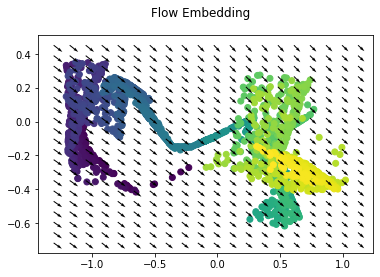

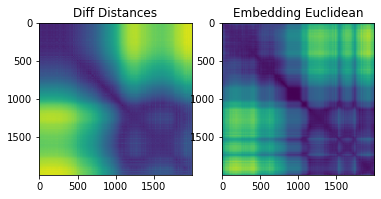

 11%|█         | 11/100 [00:19<02:31,  1.70s/it]

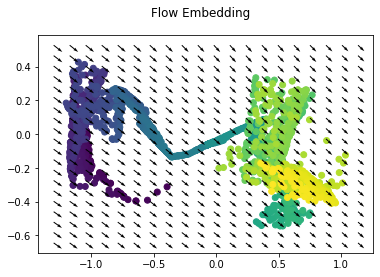

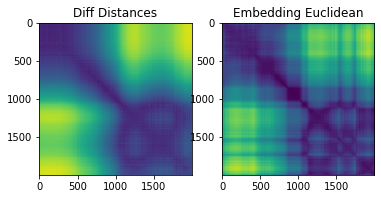

 12%|█▏        | 12/100 [00:20<02:29,  1.69s/it]

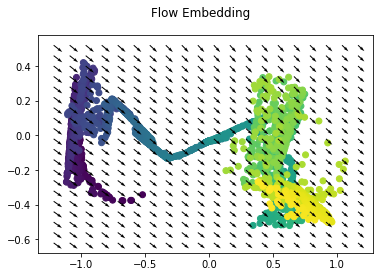

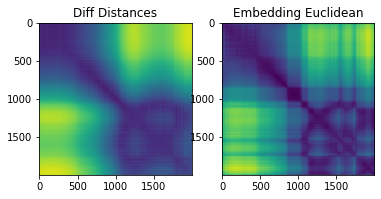

 13%|█▎        | 13/100 [00:22<02:26,  1.69s/it]

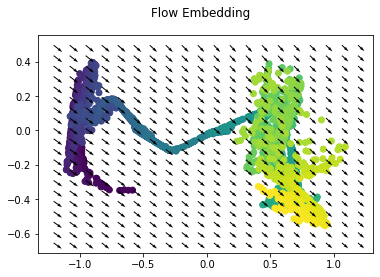

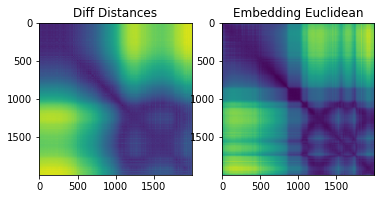

 14%|█▍        | 14/100 [00:24<02:24,  1.68s/it]

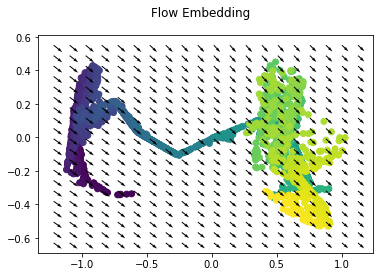

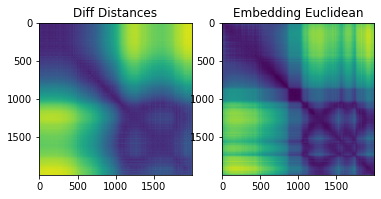

 15%|█▌        | 15/100 [00:25<02:22,  1.68s/it]

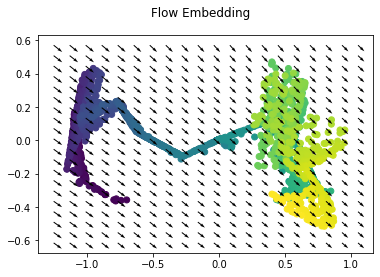

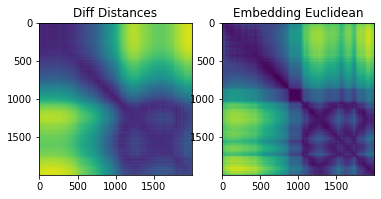

 16%|█▌        | 16/100 [00:27<02:21,  1.68s/it]

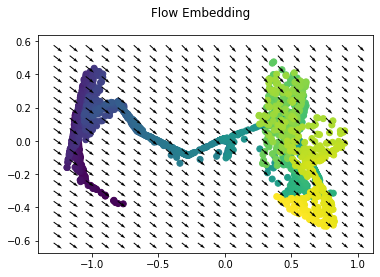

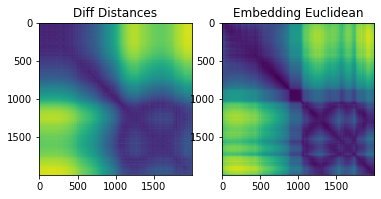

 17%|█▋        | 17/100 [00:29<02:24,  1.75s/it]

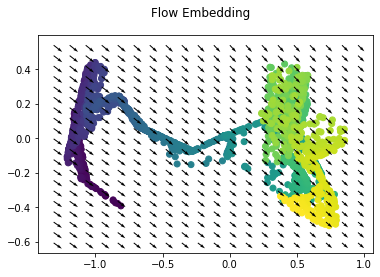

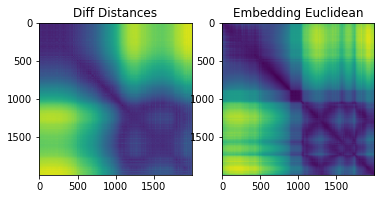

 18%|█▊        | 18/100 [00:31<02:21,  1.73s/it]

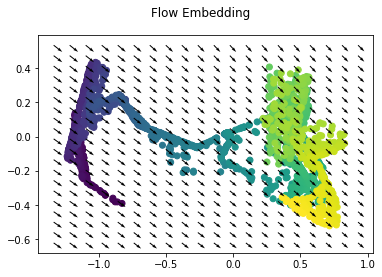

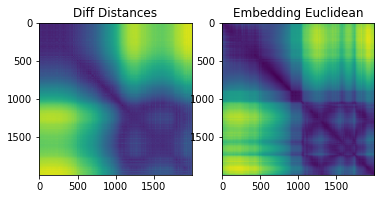

 19%|█▉        | 19/100 [00:32<02:18,  1.71s/it]

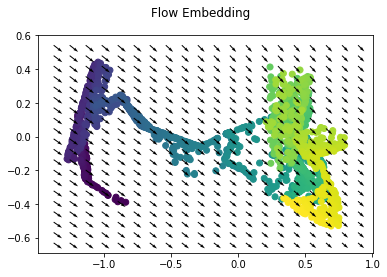

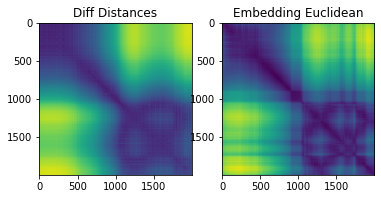

 20%|██        | 20/100 [00:34<02:15,  1.70s/it]

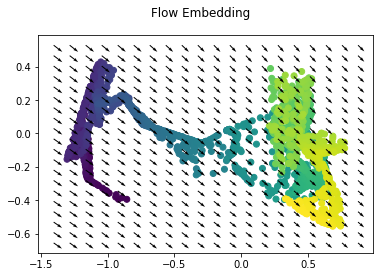

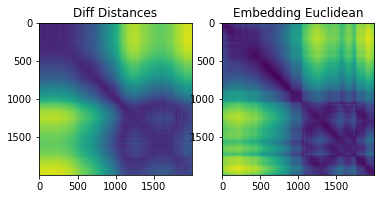

 21%|██        | 21/100 [00:36<02:13,  1.69s/it]

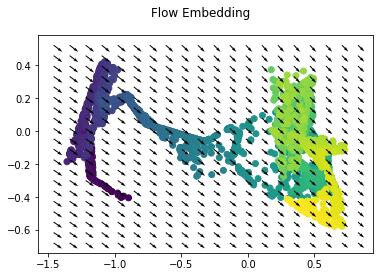

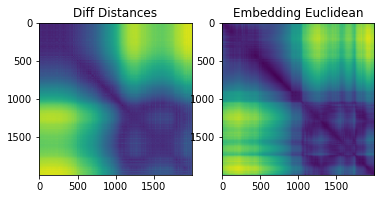

 22%|██▏       | 22/100 [00:37<02:11,  1.68s/it]

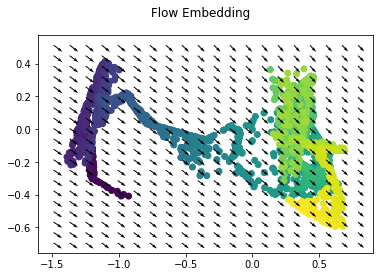

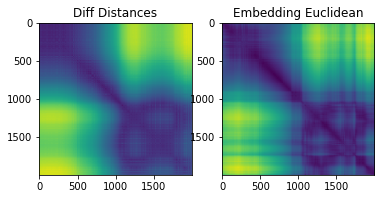

 23%|██▎       | 23/100 [00:39<02:08,  1.67s/it]

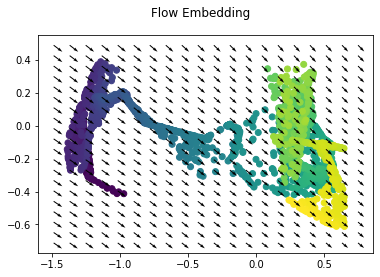

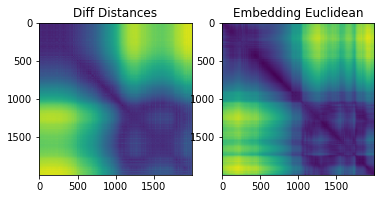

 24%|██▍       | 24/100 [00:41<02:07,  1.67s/it]

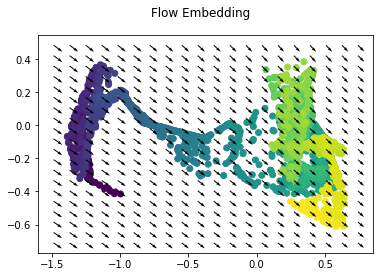

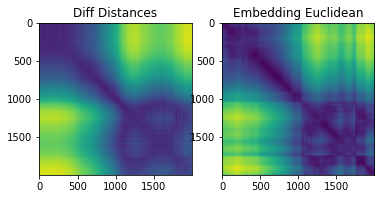

 25%|██▌       | 25/100 [00:42<02:05,  1.67s/it]

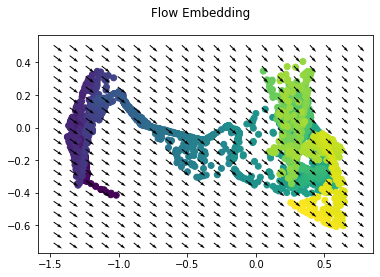

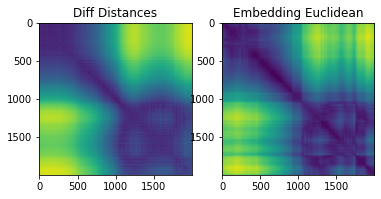

 26%|██▌       | 26/100 [00:44<02:03,  1.67s/it]

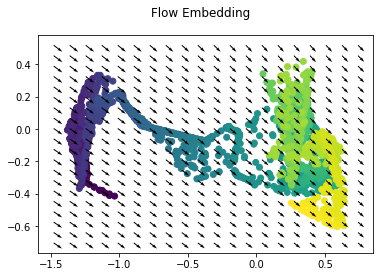

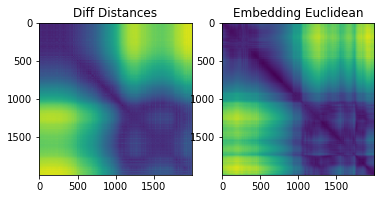

 27%|██▋       | 27/100 [00:46<02:06,  1.73s/it]

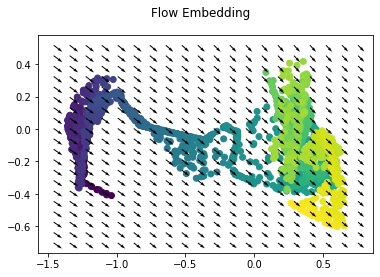

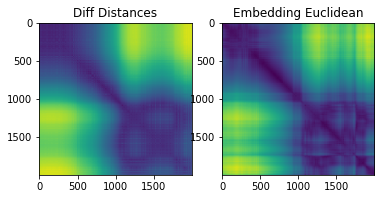

 28%|██▊       | 28/100 [00:48<02:09,  1.79s/it]

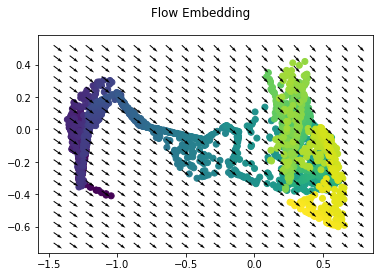

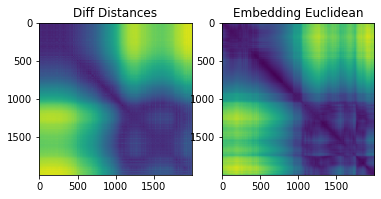

 29%|██▉       | 29/100 [00:49<02:04,  1.75s/it]

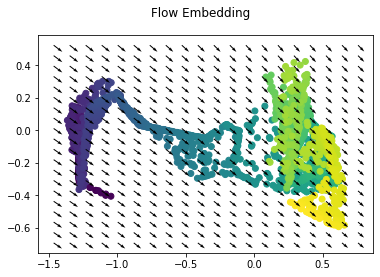

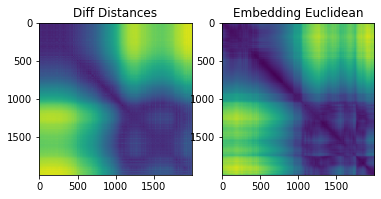

 30%|███       | 30/100 [00:51<02:00,  1.73s/it]

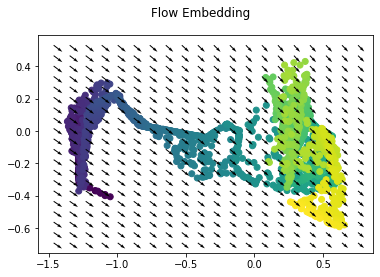

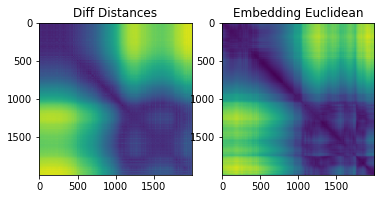

 31%|███       | 31/100 [00:53<01:57,  1.71s/it]

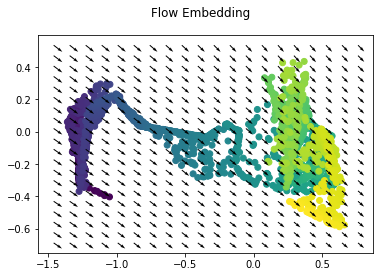

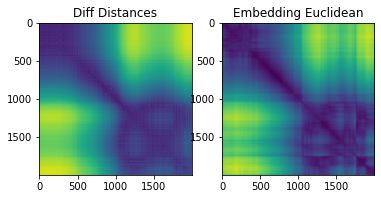

 32%|███▏      | 32/100 [00:54<01:55,  1.70s/it]

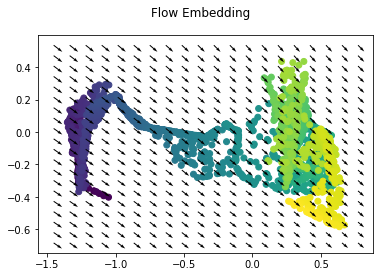

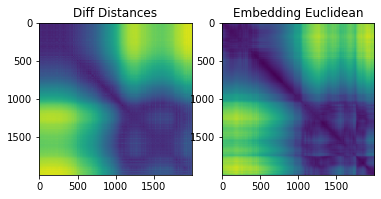

 33%|███▎      | 33/100 [00:56<01:53,  1.69s/it]

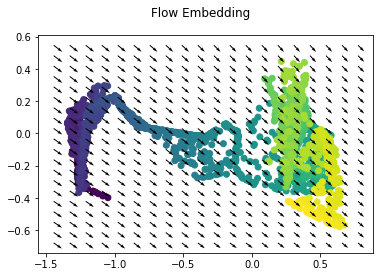

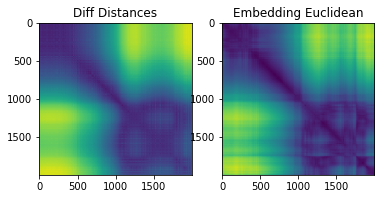

 34%|███▍      | 34/100 [00:58<01:51,  1.68s/it]

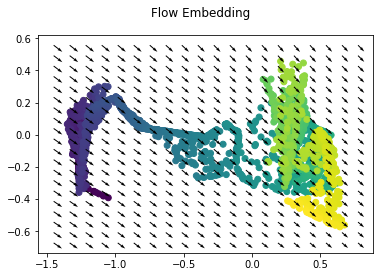

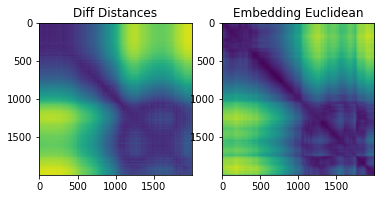

 35%|███▌      | 35/100 [01:00<01:53,  1.75s/it]

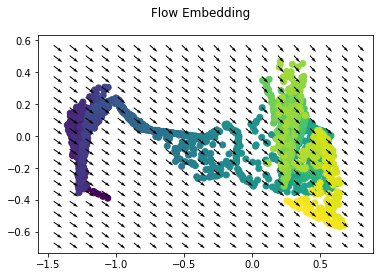

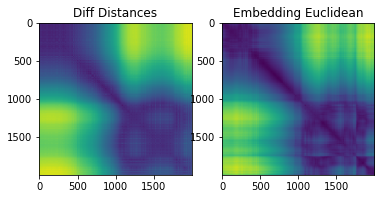

 36%|███▌      | 36/100 [01:01<01:50,  1.73s/it]

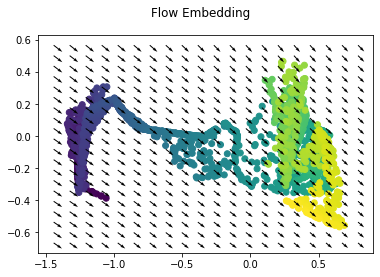

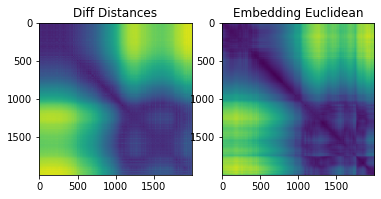

 37%|███▋      | 37/100 [01:03<01:52,  1.78s/it]

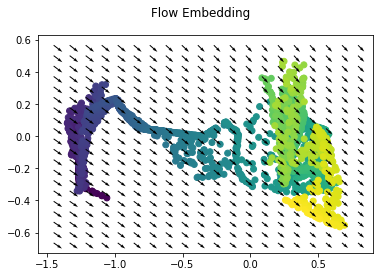

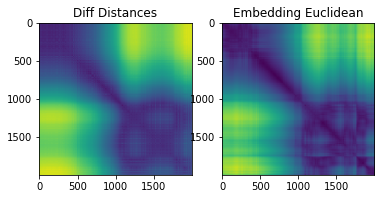

 38%|███▊      | 38/100 [01:05<01:50,  1.78s/it]

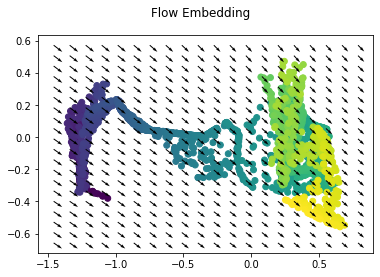

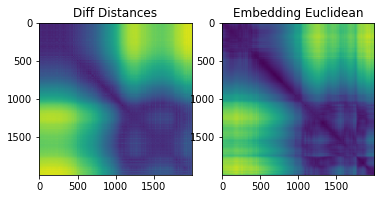

 39%|███▉      | 39/100 [01:08<02:13,  2.19s/it]

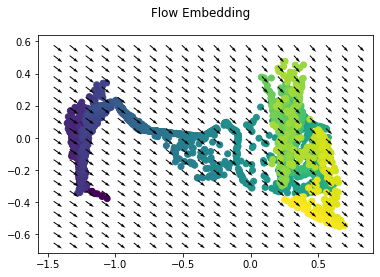

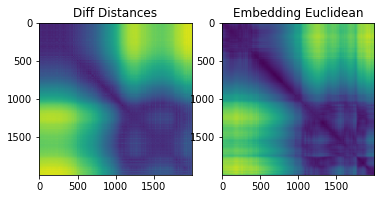

 40%|████      | 40/100 [01:11<02:28,  2.47s/it]

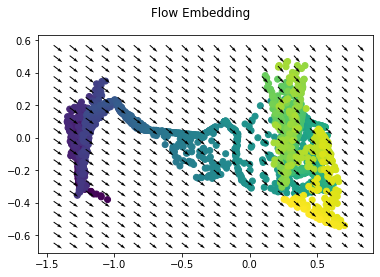

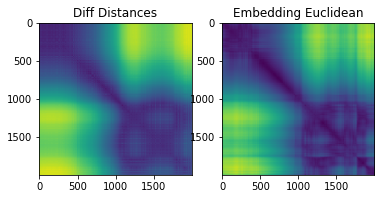

 41%|████      | 41/100 [01:14<02:37,  2.67s/it]

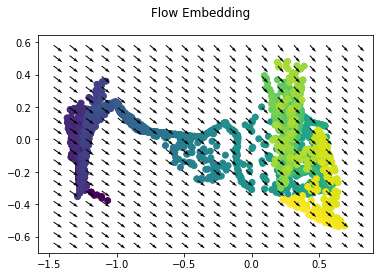

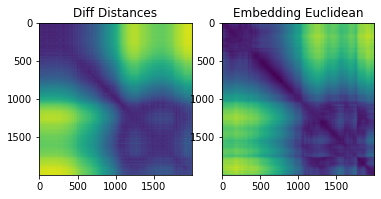

 42%|████▏     | 42/100 [01:18<02:42,  2.81s/it]

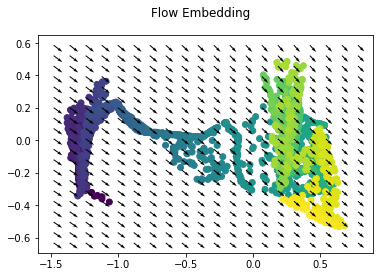

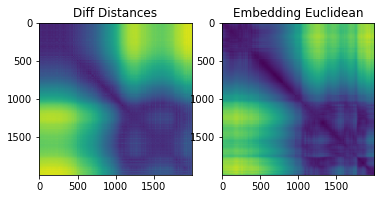

 43%|████▎     | 43/100 [01:21<02:45,  2.90s/it]

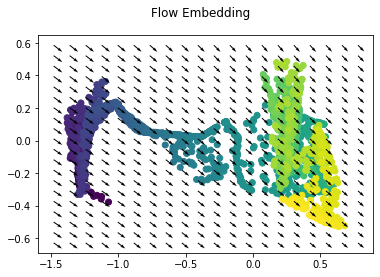

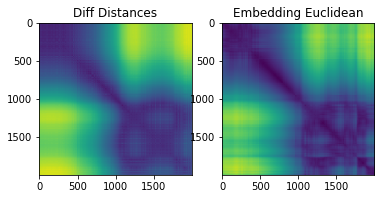

 44%|████▍     | 44/100 [01:24<02:45,  2.96s/it]

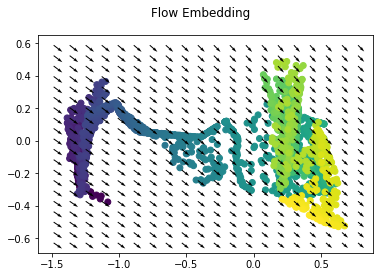

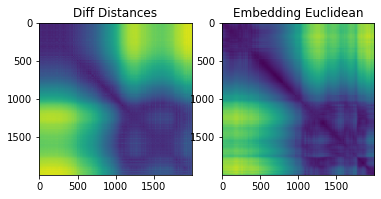

 45%|████▌     | 45/100 [01:26<02:26,  2.66s/it]

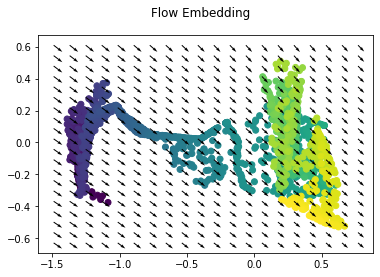

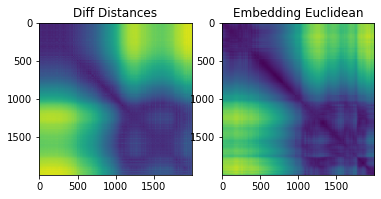

 46%|████▌     | 46/100 [01:27<02:07,  2.36s/it]

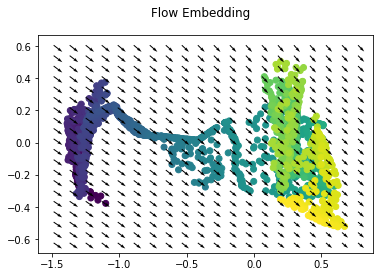

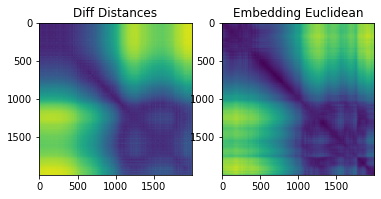

 47%|████▋     | 47/100 [01:29<01:58,  2.23s/it]

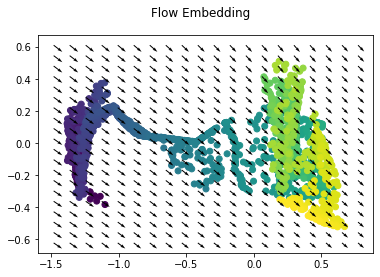

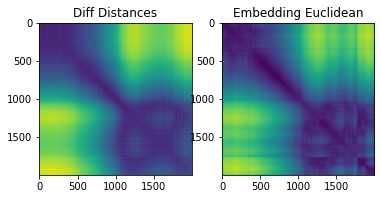

 48%|████▊     | 48/100 [01:31<01:47,  2.07s/it]

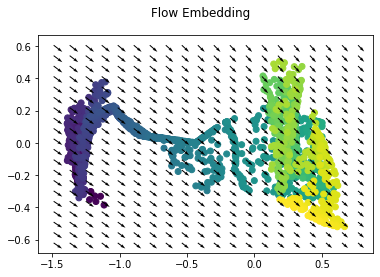

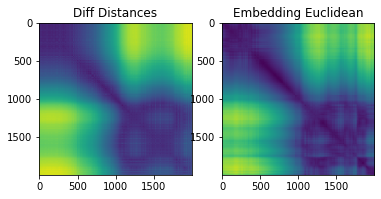

 49%|████▉     | 49/100 [01:33<01:40,  1.96s/it]

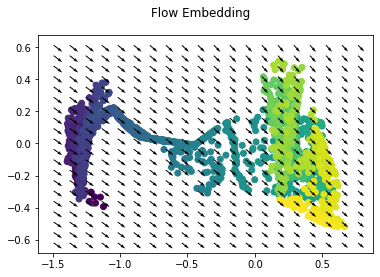

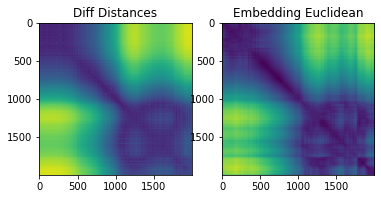

 50%|█████     | 50/100 [01:34<01:33,  1.88s/it]

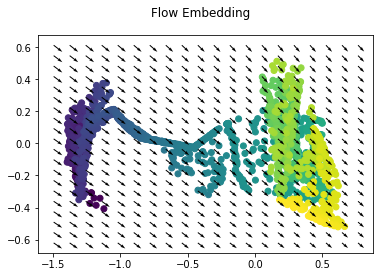

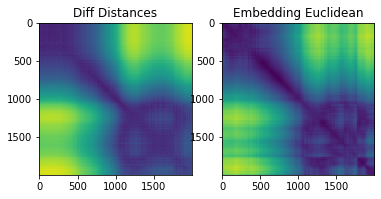

 51%|█████     | 51/100 [01:36<01:28,  1.82s/it]

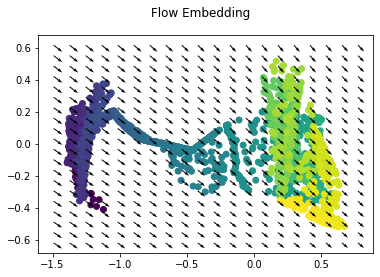

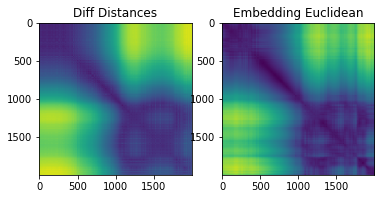

 52%|█████▏    | 52/100 [01:38<01:25,  1.77s/it]

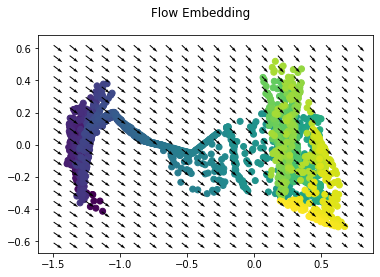

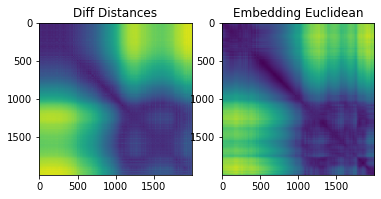

 53%|█████▎    | 53/100 [01:39<01:22,  1.76s/it]

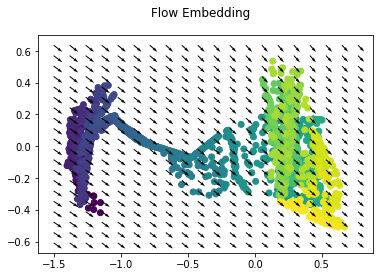

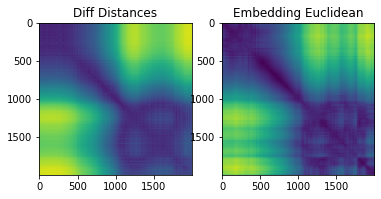

 54%|█████▍    | 54/100 [01:41<01:19,  1.74s/it]

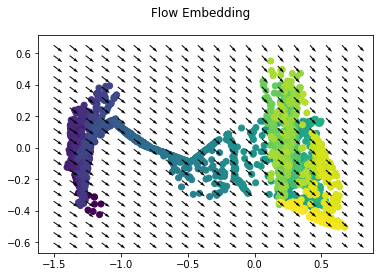

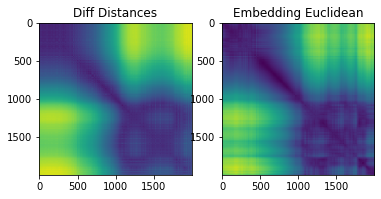

 55%|█████▌    | 55/100 [01:43<01:17,  1.72s/it]

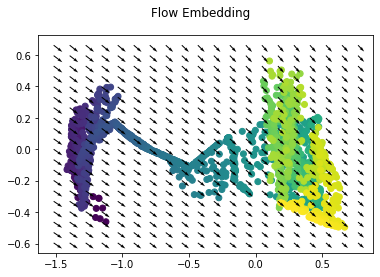

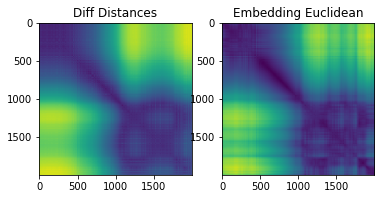

 56%|█████▌    | 56/100 [01:44<01:14,  1.70s/it]

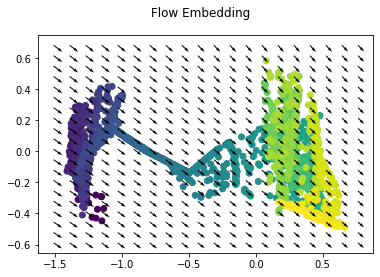

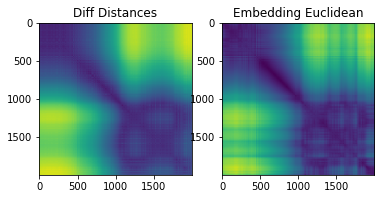

 57%|█████▋    | 57/100 [01:46<01:16,  1.78s/it]

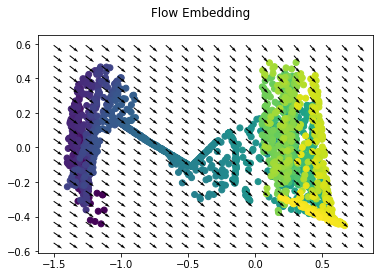

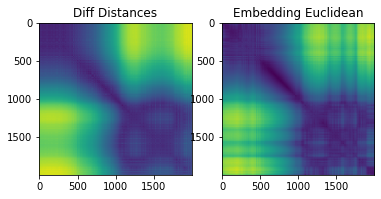

 58%|█████▊    | 58/100 [01:48<01:13,  1.76s/it]

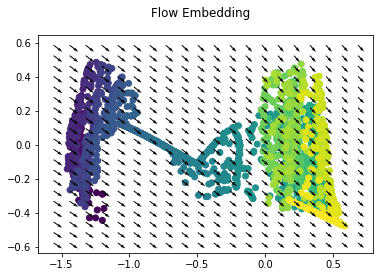

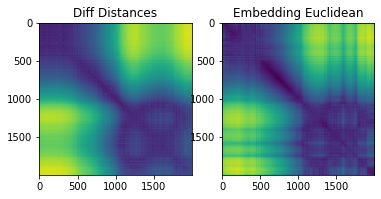

 59%|█████▉    | 59/100 [01:50<01:11,  1.73s/it]

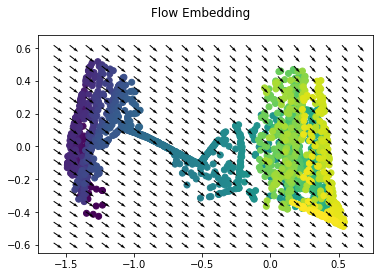

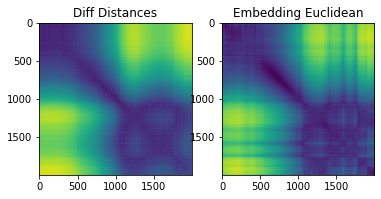

 60%|██████    | 60/100 [01:52<01:08,  1.72s/it]

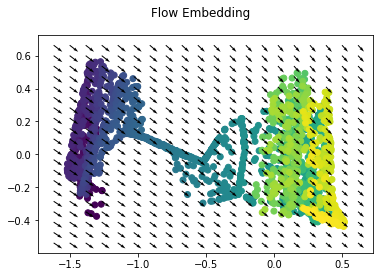

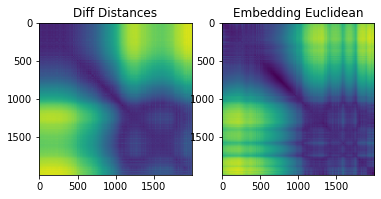

 61%|██████    | 61/100 [01:53<01:06,  1.70s/it]

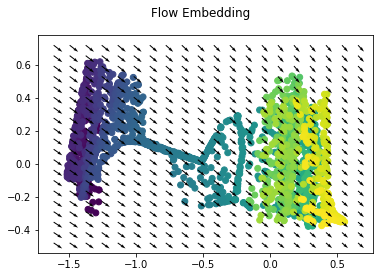

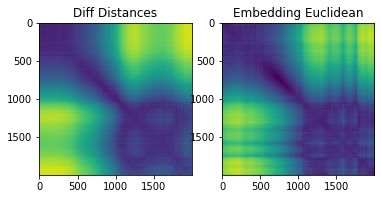

 62%|██████▏   | 62/100 [01:55<01:04,  1.69s/it]

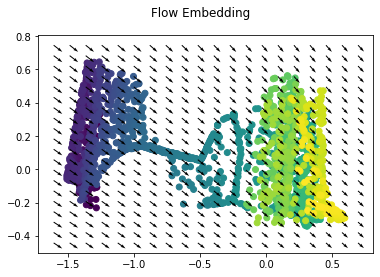

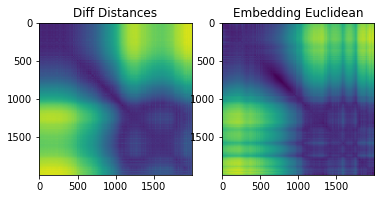

 63%|██████▎   | 63/100 [01:57<01:02,  1.69s/it]

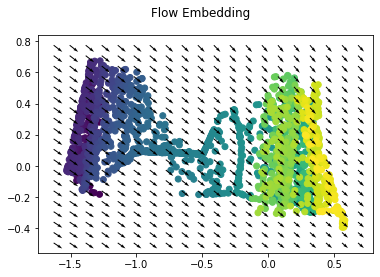

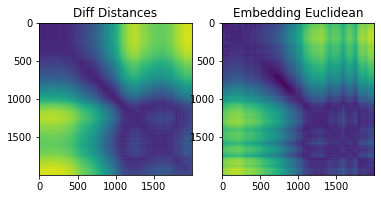

 64%|██████▍   | 64/100 [01:58<01:00,  1.68s/it]

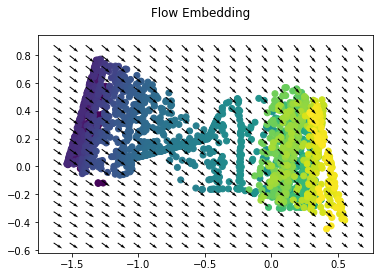

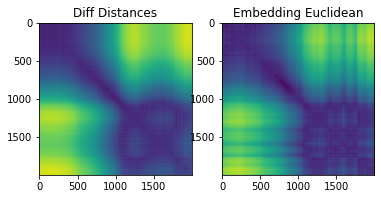

 65%|██████▌   | 65/100 [02:00<00:58,  1.68s/it]

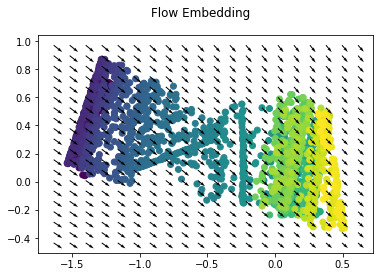

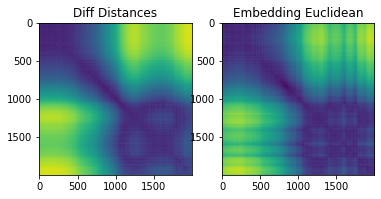

 66%|██████▌   | 66/100 [02:02<00:57,  1.68s/it]

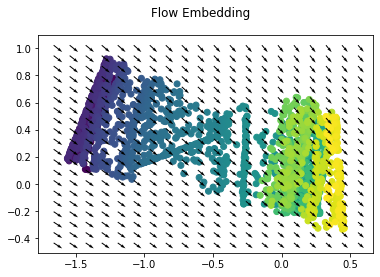

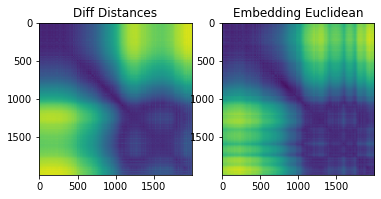

 67%|██████▋   | 67/100 [02:03<00:57,  1.75s/it]

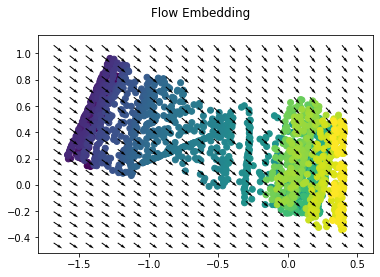

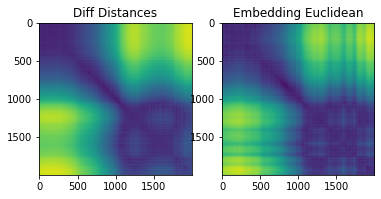

 68%|██████▊   | 68/100 [02:05<00:55,  1.73s/it]

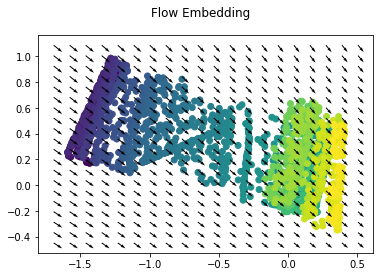

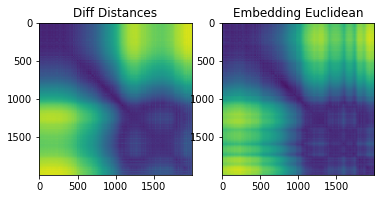

 69%|██████▉   | 69/100 [02:07<00:53,  1.72s/it]

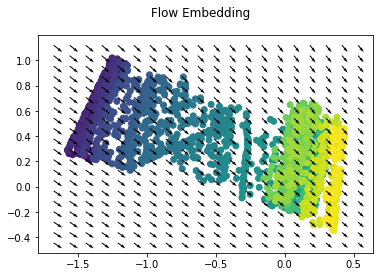

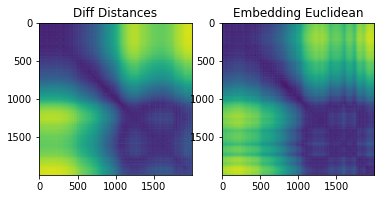

 70%|███████   | 70/100 [02:09<00:51,  1.71s/it]

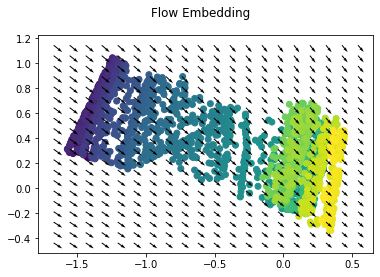

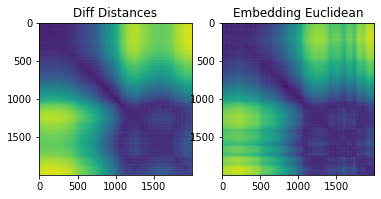

 71%|███████   | 71/100 [02:10<00:49,  1.71s/it]

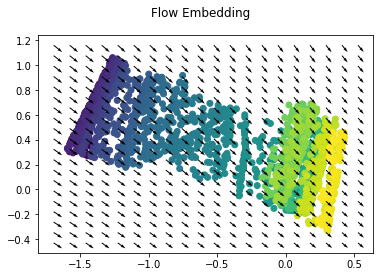

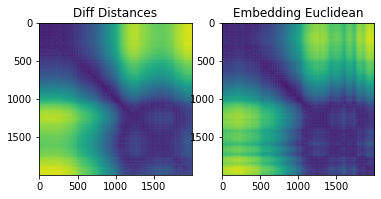

 72%|███████▏  | 72/100 [02:12<00:47,  1.71s/it]

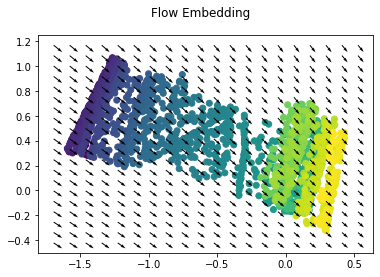

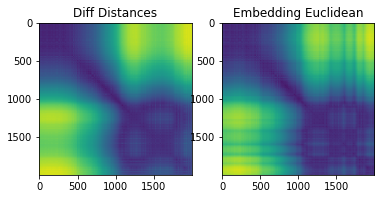

 73%|███████▎  | 73/100 [02:14<00:46,  1.72s/it]

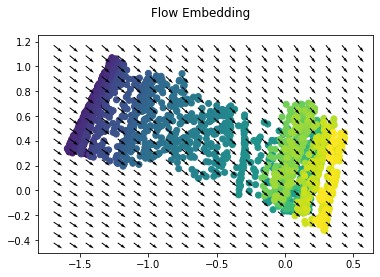

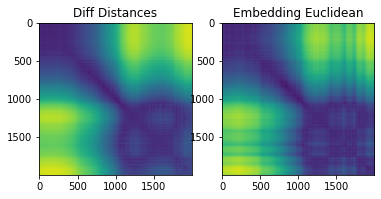

 74%|███████▍  | 74/100 [02:15<00:44,  1.71s/it]

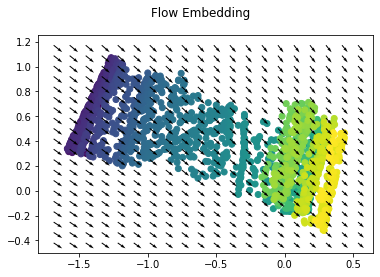

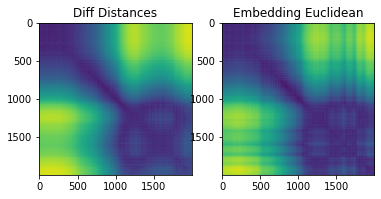

 75%|███████▌  | 75/100 [02:17<00:42,  1.70s/it]

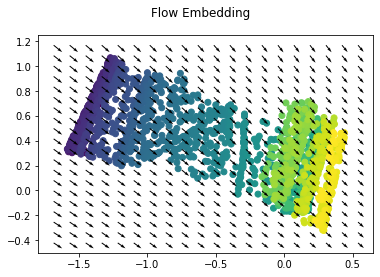

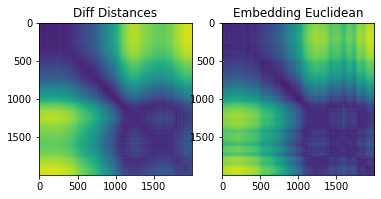

 76%|███████▌  | 76/100 [02:19<00:42,  1.79s/it]

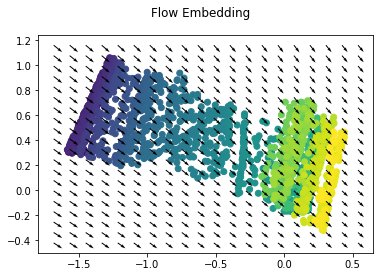

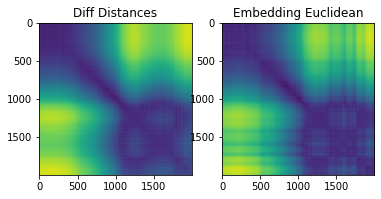

 77%|███████▋  | 77/100 [02:21<00:40,  1.77s/it]

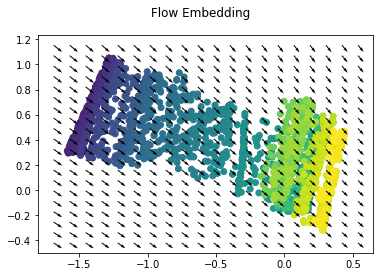

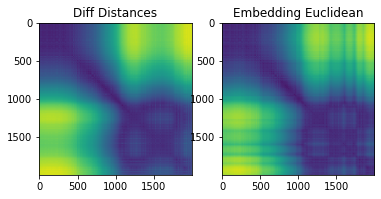

 78%|███████▊  | 78/100 [02:22<00:38,  1.75s/it]

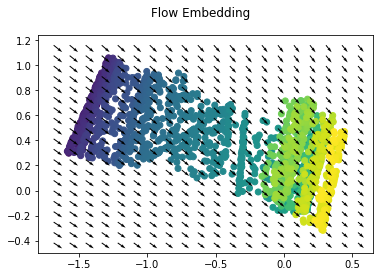

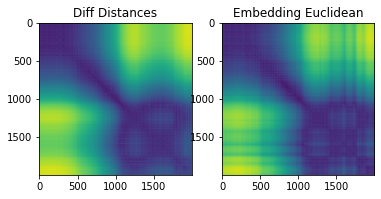

 79%|███████▉  | 79/100 [02:24<00:36,  1.73s/it]

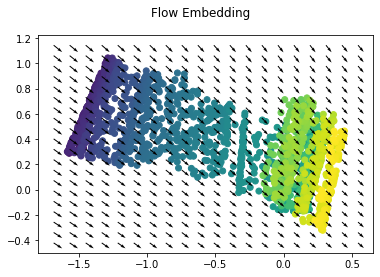

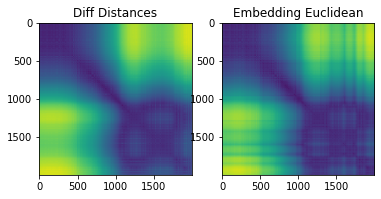

 80%|████████  | 80/100 [02:26<00:34,  1.72s/it]

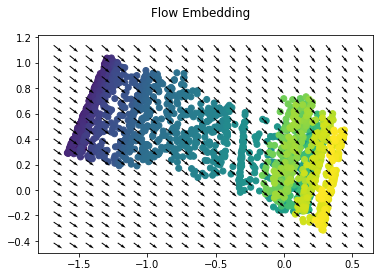

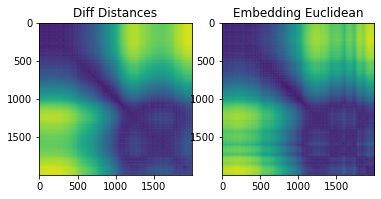

 81%|████████  | 81/100 [02:28<00:32,  1.71s/it]

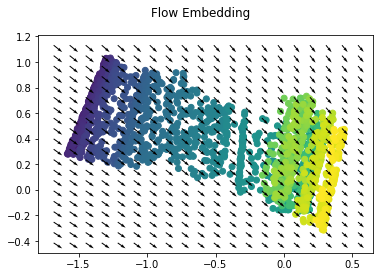

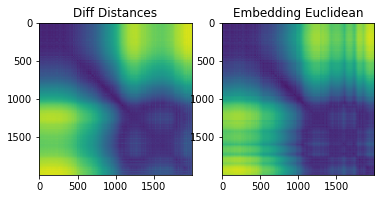

 82%|████████▏ | 82/100 [02:29<00:30,  1.71s/it]

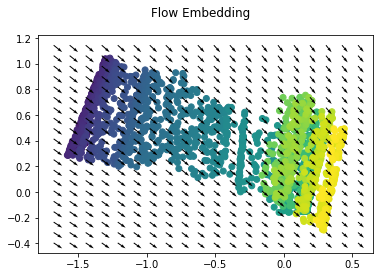

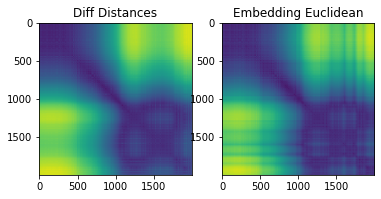

 83%|████████▎ | 83/100 [02:31<00:28,  1.70s/it]

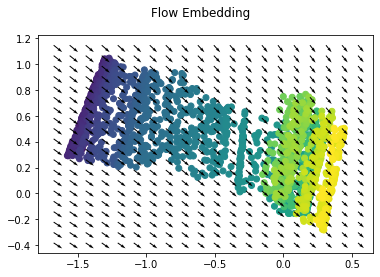

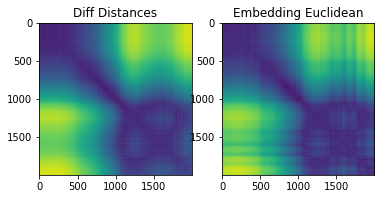

 84%|████████▍ | 84/100 [02:33<00:27,  1.70s/it]

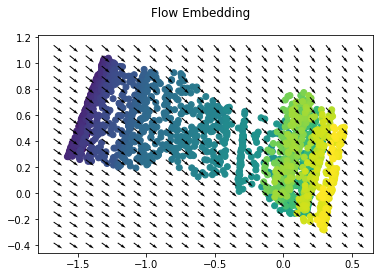

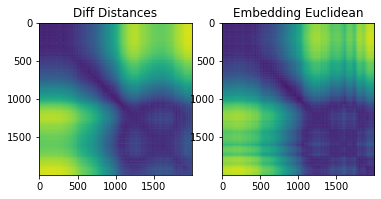

 85%|████████▌ | 85/100 [02:35<00:26,  1.76s/it]

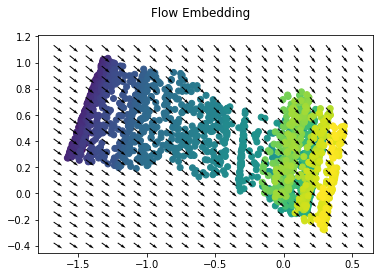

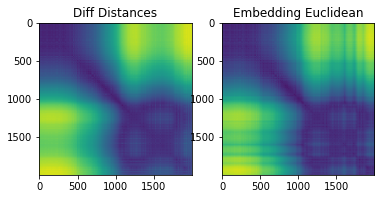

 86%|████████▌ | 86/100 [02:36<00:24,  1.74s/it]

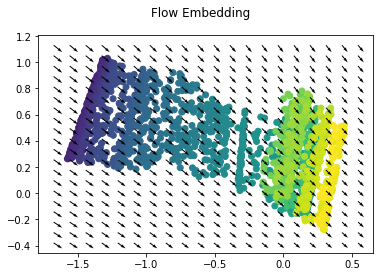

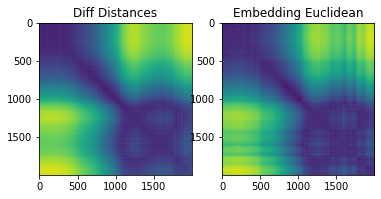

 87%|████████▋ | 87/100 [02:38<00:22,  1.73s/it]

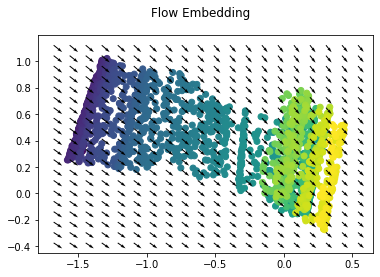

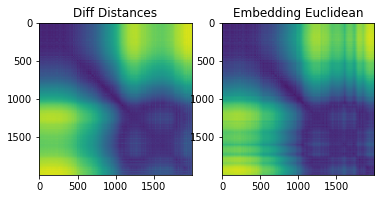

 88%|████████▊ | 88/100 [02:40<00:20,  1.71s/it]

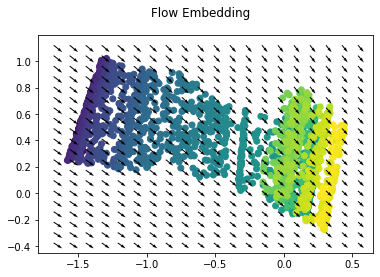

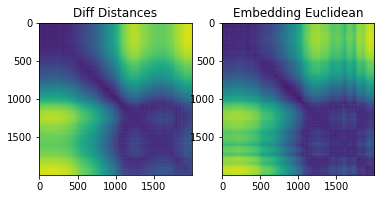

 89%|████████▉ | 89/100 [02:41<00:18,  1.70s/it]

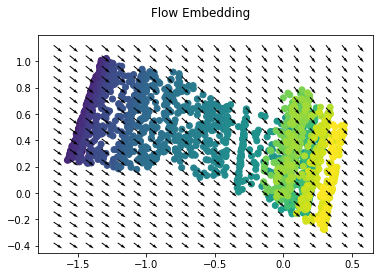

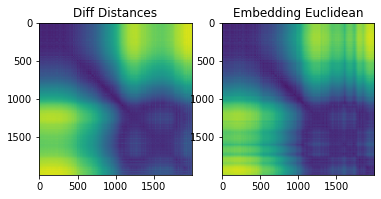

 90%|█████████ | 90/100 [02:43<00:16,  1.70s/it]

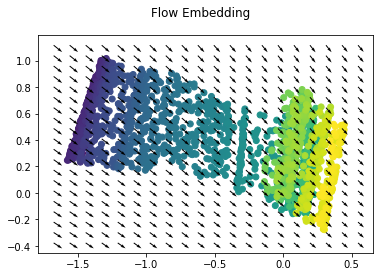

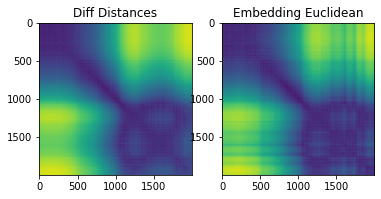

 91%|█████████ | 91/100 [02:45<00:15,  1.69s/it]

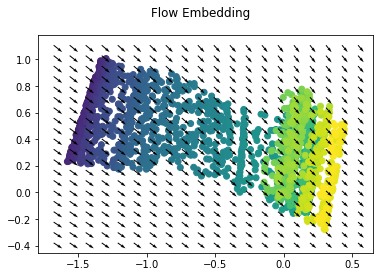

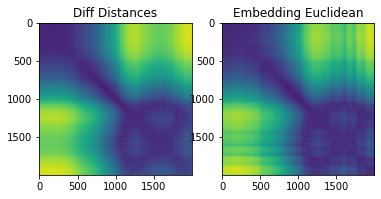

 92%|█████████▏| 92/100 [02:46<00:13,  1.69s/it]

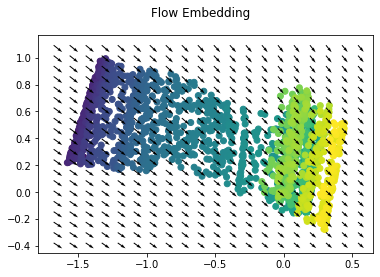

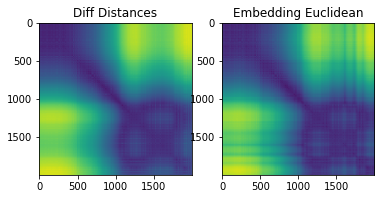

 93%|█████████▎| 93/100 [02:48<00:12,  1.75s/it]

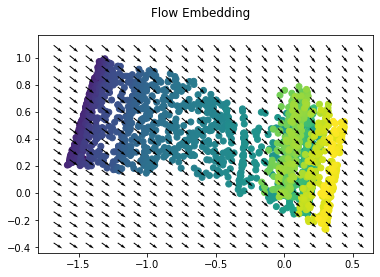

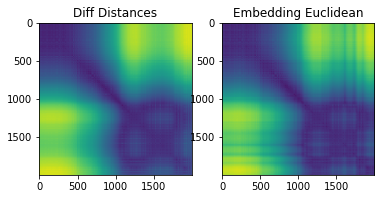

 94%|█████████▍| 94/100 [02:50<00:11,  1.84s/it]

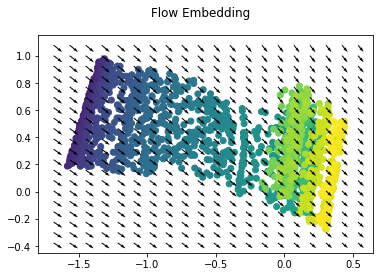

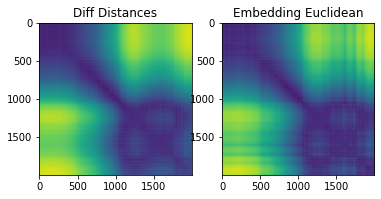

 95%|█████████▌| 95/100 [02:53<00:10,  2.09s/it]

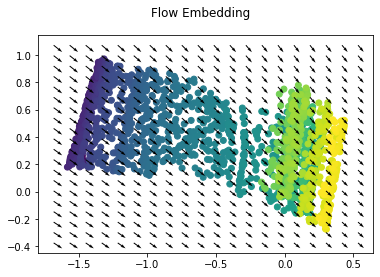

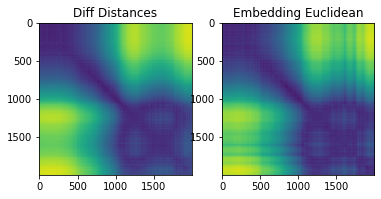

 96%|█████████▌| 96/100 [02:55<00:07,  1.97s/it]

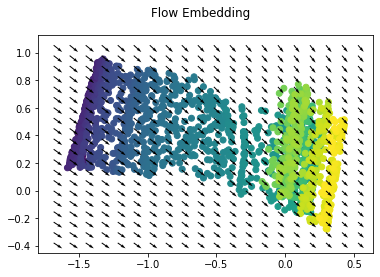

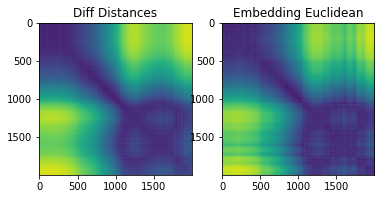

 97%|█████████▋| 97/100 [02:56<00:05,  1.88s/it]

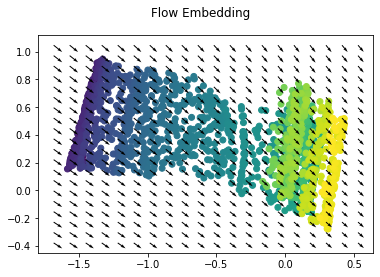

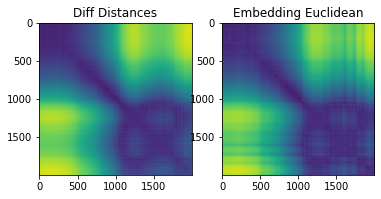

 98%|█████████▊| 98/100 [02:58<00:03,  1.82s/it]

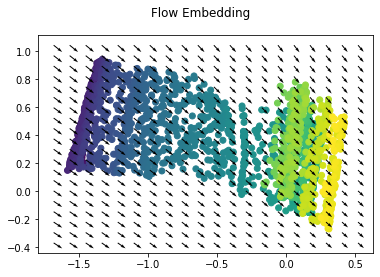

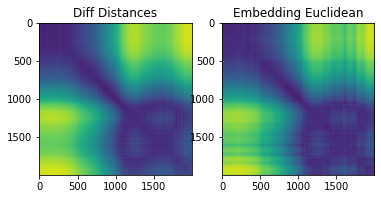

 99%|█████████▉| 99/100 [03:00<00:01,  1.79s/it]

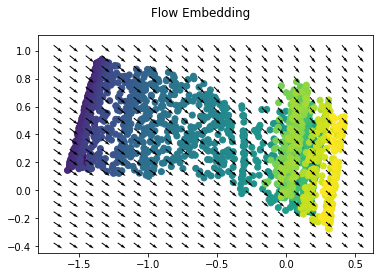

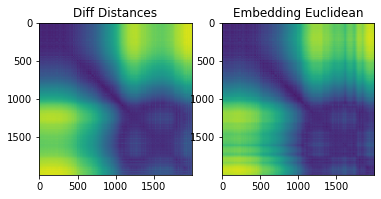

100%|██████████| 100/100 [03:01<00:00,  1.82s/it]


In [ ]:
DODO_FET.fit()

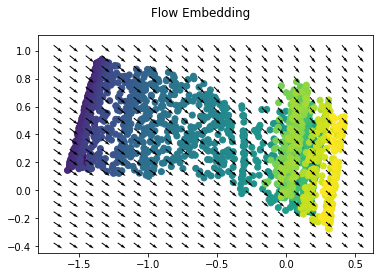

In [ ]:
DODO_FET.visualize_embedding()

In [ ]:
DODO_FET.training_gif()

HTML(value='<img src="data:image/gif;base64,R0lGODlhsAEgAYcAAP///////f//+///+v//9///8f//z/7///z///v///7//P7/+v…

In [ ]:
DODO_FET.FE.precomputed_distances

tensor([[0.0000e+00, 4.1507e-02, 1.2181e-01,  ..., 1.2438e+00, 1.2464e+00,
         1.2330e+00],
        [4.1507e-02, 9.7201e-04, 1.6310e-01,  ..., 1.2434e+00, 1.2488e+00,
         1.2310e+00],
        [1.2181e-01, 1.6310e-01, 0.0000e+00,  ..., 1.2450e+00, 1.2394e+00,
         1.2387e+00],
        ...,
        [1.2438e+00, 1.2434e+00, 1.2450e+00,  ..., 0.0000e+00, 8.6444e-02,
         4.8386e-02],
        [1.2464e+00, 1.2488e+00, 1.2394e+00,  ..., 8.6444e-02, 0.0000e+00,
         1.3239e-01],
        [1.2330e+00, 1.2310e+00, 1.2387e+00,  ..., 4.8386e-02, 1.3239e-01,
         0.0000e+00]], device='cuda:0')

In [ ]:
DODO_FET.visualize_loss()

In [ ]:
plt.scatter(DODO_FET.FE.diff_coords[:,0].cpu().numpy(),DODO_FET.FE.diff_coords[:,1].cpu().numpy(),c=labels)


In [ ]:
torch.max(DODO_FET.FE.precomputed_distances)

In [ ]:
np.amax(DODO_FET.FE.diff_coords.cpu().numpy())

In [ ]:
DODO_FET.FE.diff_coords.cpu().numpy()

In [ ]:
DODO_FET.losses['diffusion']

In [ ]:
import glob
import ipywidgets as widgets
from PIL import Image
import os
import ipywidgets as widgets
import base64
frames = [Image.open(image) for image in glob.glob(f"visualizations/{BOBO_FET.timestamp}/*.jpg")]
frame_one = frames[0]
frame_one.save(f"{BOBO_FET.title}.gif", format="GIF", append_images=frames,
           save_all=True, duration=300, loop=0)
# display in jupyter notebook
b64 = base64.b64encode(open(f"{BOBO_FET.title}.gif",'rb').read()).decode('ascii')
display(widgets.HTML(f'<img src="data:image/gif;base64,{b64}" />'))